In [11]:
A = create_A(3, 1000)
# print(A)
print(np.linalg.pinv(A))

[[ 1.01587302e+00 -1.79582675e-01  1.47252644e-16 ...  6.37043285e-15
  -6.05801119e-15  1.97186373e-15]
 [-1.79582675e-01  2.22422723e+00 -7.95623736e-01 ... -2.82248019e-13
   2.57764021e-13 -9.00291150e-14]
 [-2.15450089e-16 -7.95623736e-01  3.93826145e+00 ...  2.01751425e-12
  -1.56981882e-12  4.61578302e-13]
 ...
 [-2.86692422e-16  6.49782260e-14 -1.05550388e-12 ...  3.32002306e+05
  -1.66166757e+05 -2.88073352e-08]
 [-4.89755626e-15  3.15279817e-13 -2.39122931e-12 ... -1.66166757e+05
   3.32667972e+05 -1.66499757e+05]
 [ 4.17505170e-15 -2.86509333e-13  2.43993525e-12 ... -7.30142347e-09
  -1.66499757e+05  1.67083820e+05]]


In [17]:
N = 10000
A = create_A(1.5, N)
v = np.array([1/n**(1/2) for n in range(1, N+1)])

# truncate k terms
k = 500
A = A[k:,:]
# v = v[k:]

# print(A.shape)
print(A @ v)


[0.05923418 0.05917416 0.05911431 ... 0.00666983 0.0066685  0.00666716]


In [42]:
N = 1000
alphas = np.linspace(0.5, 2, 101)
max_vals, _ = max_eigs(N, alphas)

KeyboardInterrupt: 

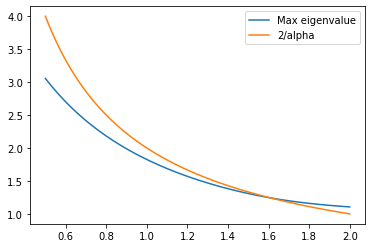

In [38]:
plt.plot(alphas, max_vals, label="Max eigenvalue")
plt.plot(alphas, 2/alphas, label="2/alpha")
plt.legend()
plt.show()

In [41]:
for i in range(len(alphas)):
    max_val = max_vals[i]
    alpha = alphas[i]

    if max_val > 2/alpha:
        print(f"lambda> alpha/2 for alpha={alpha}")
        break

lambda> alpha/2 for alpha=1.6212121212121213


In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [18]:
def create_K_alpha(alpha):
    def K(x, y):
        x+=1
        y+=1
        return (1 / np.sqrt(x*y)) * ((x*y)**alpha / np.maximum(x, y)**(2*alpha))
    return K

def create_A(alpha, N):
    K_alpha = create_K_alpha(alpha)

    A = np.fromfunction(K_alpha, (N, N))
    return A

def max_eigs(N, alphas):
    max_eigvals = []
    max_eigvecs = []
    for alpha in alphas:
        A = create_A(alpha, N)
        eigvals, eigvecs = np.linalg.eig(A)
        amax = np.argmax(eigvals)
        max_eigvals.append(eigvals[amax])
        maxvec = eigvecs[:, amax]
        maxvec /= maxvec[0]
        max_eigvecs.append(maxvec)
        # print(eigvecs)
    return np.array(max_eigvals), max_eigvecs


alphas = np.array([4, 5])
N = 4


In [5]:
lmbda, _ = max_eigs(100, [2])
print(lmbda)
print(np.sqrt(np.pi**2/6))

[1.10595149]
1.282549830161864


In [5]:
A = create_A(5, 4)
print(A)

[[1.00000000e+00 2.20970869e-02 2.37592703e-03 4.88281250e-04]
 [2.20970869e-02 5.00000000e-01 5.37610917e-02 1.10485435e-02]
 [2.37592703e-03 5.37610917e-02 3.33333333e-01 6.85039626e-02]
 [4.88281250e-04 1.10485435e-02 6.85039626e-02 2.50000000e-01]]


In [6]:
N=1000
alphas = np.linspace(2, 16, 50)
vals, vecs = max_eigs(N, alphas)

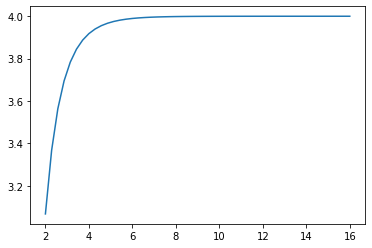

4.0


In [7]:
y = np.exp(np.log(vals - 1)/(-alphas))
plt.plot(alphas, y)
plt.show()
print(y[-1])

In [8]:
print(vals - ( 1 + 4**(-alphas)))

[4.38220059e-02 2.02939265e-02 9.79515391e-03 4.85700707e-03
 2.45320975e-03 1.25544005e-03 6.48668371e-04 3.37566448e-04
 1.76625690e-04 9.28021722e-05 4.89175370e-05 2.58503200e-05
 1.36876148e-05 7.25888063e-06 3.85435327e-06 2.04863217e-06
 1.08973570e-06 5.80036481e-07 3.08896275e-07 1.64569949e-07
 8.77071042e-08 4.67560759e-08 2.49309258e-08 1.32959133e-08
 7.09190551e-09 3.78321574e-09 2.01838279e-09 1.07691545e-09
 5.74634562e-10 3.06636938e-10 1.63634661e-10 8.73277006e-11
 4.66051642e-11 2.48725485e-11 1.32749367e-11 7.08544334e-12
 3.78141962e-12 2.01927364e-12 1.07647224e-12 5.72875081e-13
 3.06199510e-13 1.64090963e-13 8.65973959e-14 4.68514116e-14
 2.33146835e-14 1.33226763e-14 6.21724894e-15 2.22044605e-15
 4.44089210e-16 0.00000000e+00]


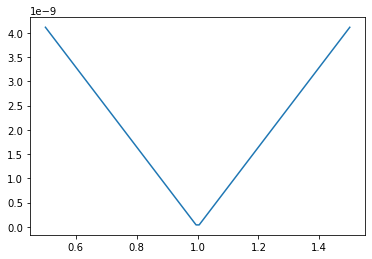

In [9]:
alpha_val = alphas[-10]
eigenval = vals[-10]

coeffs = np.linspace(0.5, 1.5, 100)
diff = eigenval - (1 + coeffs * 4**(-alpha_val))
plt.plot(coeffs, abs(diff))

[-2.37945239  1.52522714]
4.5961874066218416 0.09260127294002907
0.005577864903541262


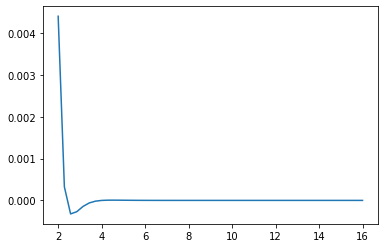

In [10]:
# zeta = 1 + 4**(-alphas) + 0*9**(-alphas) #+ 16**(-alphas) + 25**(-alphas) + 36**(-alphas) + 49**(-alphas) + 64**(-alphas) + 81**(-alphas) + 100**(-alphas)
# plt.plot(alphas, zeta)
# plt.plot(alphas, vals)

# print(vals - zeta)

# plt.plot(vals - zeta)
# plt.plot()

test_f = 1 + 4**(-alphas)  #+ 9 * 14.4**(-alphas) #+ 12*16**(-alphas)
residuals = vals  - test_f
# plt.plot(alphas, residuals)

trunc = 10
alphas_trunc = alphas[:trunc]
log_res = np.log(residuals[:trunc])

# plt.plot(alphas_trunc, log_res)
# plt.show()

p = np.polyfit(alphas_trunc, log_res, 1)
print(p)

coeff = np.exp(p[1])
pow = np.exp(p[0])
print(coeff, pow)

# plt.plot(alphas_trunc, residuals[:trunc] - (coeff) * pow**alphas_trunc)

plt.plot(alphas, residuals - (coeff) * pow**alphas)

print(np.sum(np.abs(residuals - (coeff) * pow**alphas)))
# plt.plot(alphas_trunc, coeff * pow**alphas_trunc)


In [52]:
def search(alphas, vals):
    coeffs = [i for i in np.arange(1, 10, 0.01)]
    bases = [i for i in np.arange(1.1, 3, 0.01)]
    best_coeff = -1
    best_base = -1
    best_diff = 10000
    for coeff in coeffs:
        for base in bases:
            test_f = 1 + 4**(-alphas) + coeff * base**(-alphas)
            diffs = vals - test_f
            diff = np.sum(np.abs(diffs))
            if diff < best_diff: # and min(diffs) >= 0:
                best_diff = diff
                best_coeff = coeff
                best_base = base
    return best_coeff, best_base, best_diff

# test_vals = 1 + 4**(-alphas) + 7 * 5**(-alphas)

# print(*search(alphas, vals))

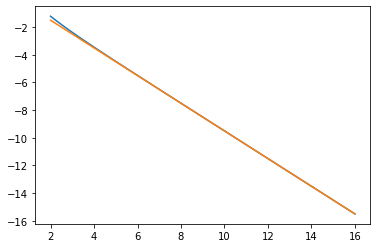

In [25]:
vecs1 = vecs
# vecs1 /= vecs1[:, 0].reshape(-1, 1)

for i in range(1, 2):
    ui = np.array([vec[i] for vec in vecs])

    exponent = (np.log(ui) / np.log(max(2, i+1)))
    plt.plot(alphas, exponent)

plt.plot(alphas, (-alphas + 1/2)) # O(alpha) line for reference
plt.show()



In [70]:
def search_new(alphas, vals):
    coeffs = [i for i in np.arange(1, 10, 0.01)]
    bases = [i for i in np.arange(1.1, 3, 0.01)]
    best_coeff = -1
    best_base = -1
    best_diff = 10000
    for coeff in coeffs:
        for base in bases:
            print(coeff, base)
            test_f = vals - coeff * base**(-alphas)
            diff = np.sum(np.abs(test_f))
            if diff < best_diff:
                best_diff = diff
                best_coeff = coeff
                best_base = base
    return best_coeff, best_base, best_diff



1.0 1.1
1.0 1.11
1.0 1.12
1.0 1.1300000000000001
1.0 1.1400000000000001
1.0 1.1500000000000001
1.0 1.1600000000000001
1.0 1.1700000000000002
1.0 1.1800000000000002
1.0 1.1900000000000002
1.0 1.2000000000000002
1.0 1.2100000000000002
1.0 1.2200000000000002
1.0 1.2300000000000002
1.0 1.2400000000000002
1.0 1.2500000000000002
1.0 1.2600000000000002
1.0 1.2700000000000002
1.0 1.2800000000000002
1.0 1.2900000000000003
1.0 1.3000000000000003
1.0 1.3100000000000003
1.0 1.3200000000000003
1.0 1.3300000000000003
1.0 1.3400000000000003
1.0 1.3500000000000003
1.0 1.3600000000000003
1.0 1.3700000000000003
1.0 1.3800000000000003
1.0 1.3900000000000003
1.0 1.4000000000000004
1.0 1.4100000000000004
1.0 1.4200000000000004
1.0 1.4300000000000004
1.0 1.4400000000000004
1.0 1.4500000000000004
1.0 1.4600000000000004
1.0 1.4700000000000004
1.0 1.4800000000000004
1.0 1.4900000000000004
1.0 1.5000000000000004
1.0 1.5100000000000005
1.0 1.5200000000000005
1.0 1.5300000000000005
1.0 1.5400000000000005
1.0 1.55

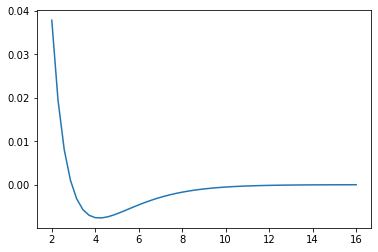

In [64]:
plt.plot(alphas, exponent - (-alphas + 1/2) - 2**(-alphas)) # O(alpha) line for reference
plt.show()
# exponent - (-alphas + 1/2) - 2**(-alphas)
# print(exponent - (- alphas + 1/2) - 2**(-alphas))
test_vals = exponent - (-alphas + 1/2)
# plt.plot(test_vals)

# plt.plot(alphas, )

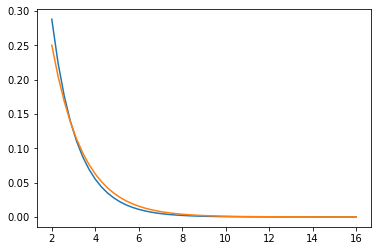

In [89]:
plt.plot(alphas, exponent - (-alphas + 1/2))
plt.plot(alphas, 2**(-alphas))

1.0 1.1
1.0 1.11
1.0 1.12
1.0 1.1300000000000001
1.0 1.1400000000000001
1.0 1.1500000000000001
1.0 1.1600000000000001
1.0 1.1700000000000002
1.0 1.1800000000000002
1.0 1.1900000000000002
1.0 1.2000000000000002
1.0 1.2100000000000002
1.0 1.2200000000000002
1.0 1.2300000000000002
1.0 1.2400000000000002
1.0 1.2500000000000002
1.0 1.2600000000000002
1.0 1.2700000000000002
1.0 1.2800000000000002
1.0 1.2900000000000003
1.0 1.3000000000000003
1.0 1.3100000000000003
1.0 1.3200000000000003
1.0 1.3300000000000003
1.0 1.3400000000000003
1.0 1.3500000000000003
1.0 1.3600000000000003
1.0 1.3700000000000003
1.0 1.3800000000000003
1.0 1.3900000000000003
1.0 1.4000000000000004
1.0 1.4100000000000004
1.0 1.4200000000000004
1.0 1.4300000000000004
1.0 1.4400000000000004
1.0 1.4500000000000004
1.0 1.4600000000000004
1.0 1.4700000000000004
1.0 1.4800000000000004
1.0 1.4900000000000004
1.0 1.5000000000000004
1.0 1.5100000000000005
1.0 1.5200000000000005
1.0 1.5300000000000005
1.0 1.5400000000000005
1.0 1.55

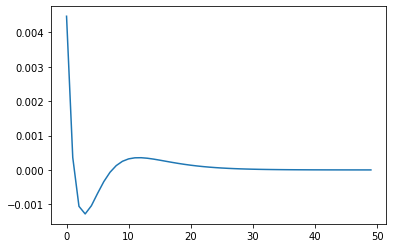

In [71]:
coeff, base, diff = search_new(alphas, test_vals)
print(coeff, base, diff)
plt.plot(test_vals - (coeff) * base**(-alphas))

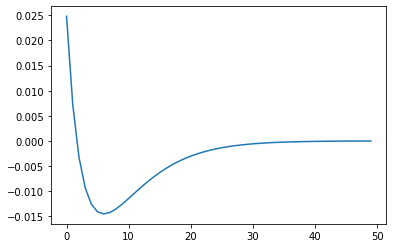

In [85]:
plt.plot(test_vals - 1.95**(-alphas))

First guess
$$\omega(n) \approx n^{-\alpha + 1/2}$$

New suggestion?
$$n^{-\alpha + 1/2 + 2^{-\alpha/2}}$$
which equals


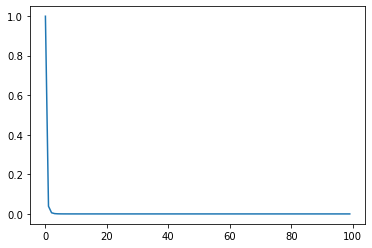

In [35]:
v1 = vecs[10, :]
plt.plot(v1)


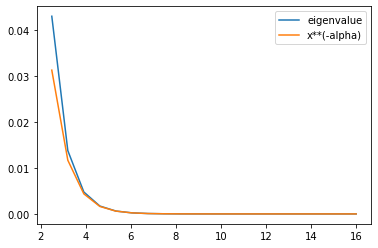

In [143]:
plt.plot(alphas, vals - 1)
plt.plot(alphas, 1*4**(-alphas))
plt.legend(["eigenvalue", "x**(-alpha)"])
plt.show()

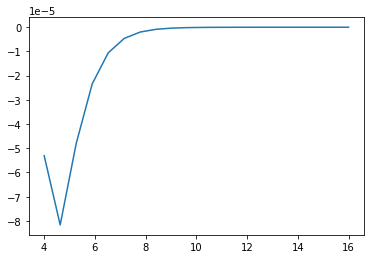

In [163]:
plt.plot(alphas, vals - 1 - 1.1*4**(-alphas) )

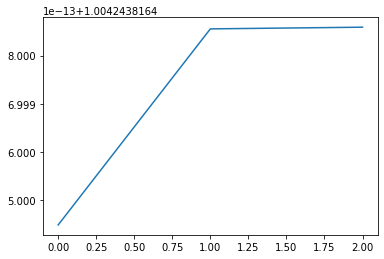

In [129]:
tmp = []

for N in [100, 200, 500]:
    alpha = 4
    A = create_A(alpha, N)
    eigvals, eigvecs = np.linalg.eig(A)
    amax = np.argmax(eigvals)
    tmp.append(eigvals[amax])

plt.plot(tmp)

In [113]:
# plt.plot(-np.log(alphas), np.log(vals-1)/(-alphas))

In [122]:
print(vals - 1 - 1*4.0**(-alphas))

[4.38220059e-02 2.91714874e-02 1.91288429e-02 1.23233142e-02
 7.77763447e-03 4.79527510e-03 2.87986442e-03 1.67970486e-03
 9.48535480e-04 5.16921998e-04 2.70932404e-04 1.36077897e-04
 6.52431240e-05 2.97390897e-05 1.28315533e-05 5.21653625e-06
 1.98838912e-06 7.06910955e-07 2.33106288e-07 7.08751329e-08
 1.97442091e-08 5.00568725e-09 1.14667283e-09 2.35515267e-10
 4.30161050e-11 6.92498346e-12 9.72146604e-13 1.15836464e-13
 1.16885401e-14 0.00000000e+00]


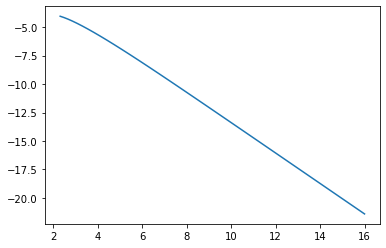

In [106]:
def rate(vals, alphas):
    h_vals = alphas[1:] - alphas[:-1]
    vals = vals[1:]
    errors = vals - 1
    num = np.log(errors[1:] / errors[:-1])
    denom = np.log(h_vals[1:]/h_vals[:-1])
    return  num / denom 

plt.plot(alphas[2:], rate(vals, alphas))

ValueError: x and y must have same first dimension, but have shapes (29,) and (28,)

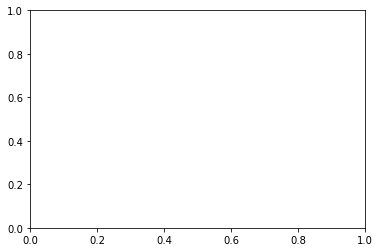

In [94]:
def find_rate_of_convergence(vals, alphas):
    errors = np.abs(vals - 1)
    h_vals = alphas[1:] - alphas[:-1]
    q_est = np.log( errors[2:] / errors[1:-1] ) / np.log( h_vals[1:] / h_vals[:-1] )
    return q_est

q_est = find_rate_of_convergence(vals, alphas)
plt.plot(alphas[:-1], q_est)

[ -5.46229231  -5.74652501  -6.04251484  -6.35103571  -6.67289051
  -7.00891253  -7.3599668   -7.7269513   -8.11079822  -8.51247528
  -8.93298705  -9.37337647  -9.8347265  -10.31816203 -10.82485203
 -11.35601187 -11.91290611 -12.49685139 -13.10921977 -13.75144216
 -14.42501219 -15.13149014 -15.87250716 -16.64976963 -17.46506368
 -18.3202599  -19.21731842 -20.15829289 -21.14533681 -22.18070787]


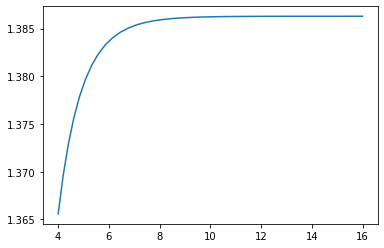

In [3]:
example_matrix = create_A(1, 5)
print(example_matrix)


[[1.         0.35355339 0.19245009 0.125      0.08944272]
 [0.35355339 0.5        0.27216553 0.1767767  0.12649111]
 [0.19245009 0.27216553 0.33333333 0.21650635 0.15491933]
 [0.125      0.1767767  0.21650635 0.25       0.17888544]
 [0.08944272 0.12649111 0.15491933 0.17888544 0.2       ]]


In [134]:
N = 1000
A = create_A(4, N)

In [135]:
eigvals, eigvecs = np.linalg.eigh(A)

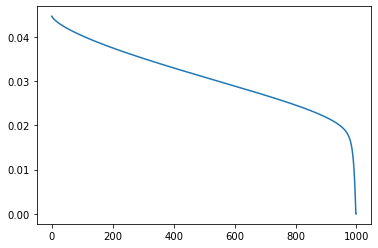

In [136]:
amax = np.argmax(eigvals)

plt.plot(np.abs(eigvecs[amax]))
plt.show()

In [137]:
print(eigvals[amax])


1.0042438164478606


In [133]:
print(eigvals[amax])

1.0042438164474465


In [168]:
alphas = np.linspace(0.1, 5, 50)
eigenvalues, eigenvectors = max_eigs(300, alphas)

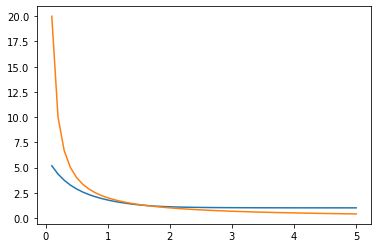

In [169]:
plt.plot(alphas, eigenvalues)
plt.plot(alphas, 2/alphas)